We want to show the Electric, Magnetic, and Pixel Intensity from Swarm B

In [1]:
import numpy as np #Lets handle our imports now for section A
import matplotlib.pyplot as plt
import asilib
import asilib.asi
from datetime import datetime, timedelta
from scipy.optimize import curve_fit
from viresclient import set_token
from viresclient import SwarmRequest
import geopack.geopack as gp

import scienceplots

plt.style.use(['science','no-latex'])
alt=150

Load IGRF coefficients ...


In [2]:
time_array=(datetime(2022,12,19,14,2), datetime(2022,12,19,14,8))

In [3]:
#From documentation link
def requester(sc_collection, measurement, residual, sampling_step=None, **kwargs):
    try:
        request = SwarmRequest()
        request.set_collection(sc_collection)
        if residual == True:
            request.set_products(
                measurements=measurement,
                models=["CHAOS"],
                residuals=True,
                sampling_step=sampling_step,
            )
        else:
            request.set_products(
                measurements=measurement,
                models=["CHAOS"],
                sampling_step=sampling_step,
            )
        data = request.get_between(datetime(2022,12,19,14,4), datetime(2022,12,19,14,6), **kwargs) #sets to get data between the first and last value in the time tuple
        df = data.as_dataframe()
    except:
        df = []
    return df

In [4]:
def arrangement(time, array, shape):  # arranges B into a useable format for use later
    barranged = np.zeros((len(time), shape))
    # Re-arranges into proper (n x 3 ) matricies, ugly but works
    for j in range(len(time)):
        for k in range(shape):
            barranged[j][k] = array[j][k]
    return barranged

In [5]:
def unit_array(array):
    arraysum = np.sum(np.abs(array), axis=1)
    # Normalizes and finds unitary
    array_unit = array / arraysum[:, np.newaxis]  # normalizes
    return array_unit

In [6]:
#Lets do B first
ds = requester( 
    "SW_OPER_MAGB_HR_1B", #Mag B, high resolution, 50Hz B (Magnetic field)
    "B_NEC", #Magnetic field in NEC coordinates
    True, 
    asynchronous=False,
    show_progress=False) 
BNEC=ds["B_NEC_res_CHAOS"]
Btime = BNEC.index.to_numpy()
BNEC = arrangement(Btime, ds["B_NEC_res_CHAOS"], 3)


latitude_B, longitude_B, altitude_B = ds['Latitude'].to_numpy(), ds['Longitude'].to_numpy(),  (ds["Radius"].to_numpy()-6.371e6)/1e3 #km  # Gets Emphermis data

C:\Users\1101w\AppData\Local\Temp\ipykernel_16764\2246279540.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  barranged[j][k] = array[j][k]


In [7]:
from scipy.spatial.transform import Rotation as R
import numpy as np

def quaternion_inverse_scipy(q):
    # Ensure q is a numpy array
    q = np.asarray(q)
    
    # Create a Rotation object from the quaternion
    rotation = R.from_quat(q)  # Note: scipy uses [x, y, z, w] format
    
    # Compute the inverse rotation
    inverse_rotation = rotation.inv()
    
    
    return inverse_rotation

In [8]:

def find_closest_indices(times1, times2):
    # Convert to numpy arrays
    times1 = np.array(times1)
    times2 = np.array(times2)
    
    # Compute the differences between each time in times1 and all times in times2
    # Resulting in a 2D array where each row contains the absolute differences for one time in times1
    differences = np.abs(times1[:, None] - times2)
    
    # Find the index of the minimum difference for each time in times1
    closest_indices = np.argmin(differences, axis=1)
    
    return closest_indices

In [9]:

from scipy.optimize import curve_fit
import geopack.geopack as gp
def footprint(time, latitude, longitude, altitude, alt,vsw= [-400,0,0]):
    """
    time, datetime, time for magnetic data for footprint
    vsw velocity of solar wind, tuple of x,y,z
    longitude of satellite in degrees
    latitude of satellite in degrees
    altitude of satellite in km from centre of earth (should be above ~6371)
    THIS CODE ONLY Works in the NOrthern hemisphere

    """
    def cubic(t, a, b, c, d):
            return a*t**3 + b*t**2 + c*t + d
    def x(t, params_x):
        return cubic(t, *params_x)

    def y(t, params_y):
        return cubic(t, *params_y)

    def z(t, params_z):
        return cubic(t, *params_z)
    def radius(t, params_x, params_y, params_z):
        return np.sqrt(x(t, params_x)**2 + y(t, params_y)**2 + z(t, params_z)**2)
    
    def curve_fit_func(xx,yy,zz, differencealt):
        
        r = np.linspace(1, 1.5, 100000)# construct an array of radiuses from 1-1.5

        radius_data=np.sqrt(xx**2+yy**2+zz**2)

        params_x, _ = curve_fit(cubic, radius_data, xx) #Constructs fits on the traces inward since the spatial resolution produced by geopack is limited.
        params_y, _ = curve_fit(cubic, radius_data, yy)
        params_z, _ = curve_fit(cubic, radius_data, zz)

        

        index_closest=np.argmin(np.abs(radius(r, params_x, params_y, params_z)-(alt-differencealt+6371)/6371))#Find the index that produces the closest radius to the altitude

        return x(r[index_closest],params_x ),y(r[index_closest],params_y ),z(r[index_closest],params_z )
    
    t1 = time
    t0 = datetime(1970,1,1) #epoch
    ut = (t1-t0).total_seconds()
    lat_sat=np.deg2rad(latitude)
    lon_sat=np.deg2rad(longitude) #converts to radii
    gp.recalc(ut)
    r, theta= gp.geodgeo(altitude,lat_sat,1) #this r accounts for earths oblateness, so we need to find the difference between my 6371 assumption and the real value and account for that
    differencearray= (altitude+6371)-r
    x_gc,y_gc,z_gc = gp.sphcar((r)/6371,theta,lon_sat,1)  #spherical to cartesian
    

    x_gsm, y_gsm, z_gsm = gp.geogsm(x_gc,y_gc,z_gc, 1) #cartesian to gsm

    x_foot,y_foot,z_foot=np.zeros(len(x_gsm)), np.zeros(len(y_gsm)), np.zeros(len(z_gsm)) #initalize an array
    for index in range(len(x_gsm)):
        x_foot_int, y_foot_int, z_foot_int, xx, _,zz = gp.trace(x_gsm[index], y_gsm[index], z_gsm[index], dir=1,rlim=1.6, maxloop=3000 ) #traces each set of lat,lon,alt outward
        _, _, _, xx2,yy2,zz2 = gp.trace(x_foot_int, y_foot_int, z_foot_int, dir=-1,rlim=100, maxloop=1000 )#Traces inward

        x_foot[index],y_foot[index],z_foot[index] = curve_fit_func(xx2,yy2,zz2, differencearray[index])


            

    x_done, y_done, z_done = gp.geogsm(x_foot, y_foot, z_foot, -1)

    alt_sat_done, lat_sat_done,lon_sat_done = np.zeros(len(x_done)), np.zeros(len(x_done)), np.zeros(len(x_done))
    for index in range(len(x_done)):
        
        r_done,theta_done,lon_sat_done[index]= gp.sphcar(x_done[index], y_done[index], z_done[index],-1)

        alt_sat_done[index], lat_sat_done[index]= gp.geodgeo(r_done*6371,theta_done,-1) #TODO check if this is right

    print(alt_sat_done, 'altitude derived from fit')

    if np.any(np.abs(alt_sat_done - alt) > 5):
        raise Exception("One or more values in the footprinting are greater than 5km away from the specified alt. Contact owner for a fix, not your fault")
    print(np.rad2deg(lon_sat_done)-360,np.rad2deg(lat_sat_done) , 'lat and lon' )
    sat_lla=np.array([ np.rad2deg(lat_sat_done), np.rad2deg(lon_sat_done)-360,  alt_sat_done])
    return sat_lla

In [10]:
measurements_E = [
        "VsatN",
        "VsatE",
        "VsatC",
        "Evx",
        "Evy",
        "Evz",
        "Vixv",
        "Viy",
        "Viz",
        "Quality_flags",
    ]
dsE = requester( 
    "SW_EXPT_EFIB_TCT16", #Mag B, high resolution, 50Hz B (Magnetic field)
    measurements_E, #Magnetic field in NEC coordinates
    True, 
    asynchronous=False,
    show_progress=False) 
dsB = requester( 
    'SW_OPER_MAGB_HR_1B', #Mag B, high resolution, 50Hz B (Magnetic field)
    ["q_NEC_CRF"], #Magnetic field in NEC coordinates
    False, 
    asynchronous=False,
    show_progress=False)

latitude_E, longitude_E, altitude_E = dsE['Latitude'].to_numpy(), dsE['Longitude'].to_numpy(),  (dsE["Radius"].to_numpy()-6.371e6)/1e3 #km  # Gets Emphermis data


In [11]:
sat_lla_B=footprint(time_array[0], latitude_B, longitude_B, altitude_B, alt, vsw=[-345,12,-12])


[150.10593796 150.10559336 150.1370933  ... 150.2225026  150.22208913
 150.22166512] altitude derived from fit
[-117.84339792 -117.84318696 -117.84300528 ... -116.97064547 -116.97054922
 -116.97045295] [65.84075831 65.83952831 65.83825947 ... 58.48075142 58.47952818
 58.47830491] lat and lon


In [12]:
indicies=find_closest_indices(dsE.index, dsB.index)
quatnecrf=dsB["q_NEC_CRF"].to_numpy()[indicies]
quaternions = []
vsat=np.array([dsE["Vixv"] , dsE["Viy"], dsE["Viz"]]).T
Etime = dsE.index
ENEC=[]
VNEC=[]
for i in range(len(quatnecrf)):
    inverse_quat = quaternion_inverse_scipy(dsB["q_NEC_CRF"].to_numpy()[indicies][i])

    rot_NEC_V= inverse_quat.apply(vsat[i])
    VNEC.append(rot_NEC_V)

ENEC=np.array(ENEC)
VNEC=np.array(VNEC)


Now for the hard part, the pixel intensity
Since the satellite as seen in figure 1 passes through the arc pretty fast, we should increase the resolution of the pixel intensity by super imposing 

Lets define the imager

In [13]:
from scipy.interpolate import CubicSpline
cs_lat = CubicSpline( Btime, sat_lla_B[0])
cs_lon = CubicSpline( Btime, sat_lla_B[1])
cs_alt = CubicSpline( Btime, sat_lla_B[2])

#sat_lla_E=footprint(time_array[0], latitude_E, longitude_E, altitude_E, alt, vsw=[-345,12,-12])
sat_lla_E= np.array([cs_lat(Etime), cs_lon(Etime),  cs_alt(Etime)]) #km  # Gets Emphermis data latitude, longitude, altitude


In [14]:
asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt,   time_range=time_array, colors='r')


Transition Region Explorer (TREx) RGB data is courtesy of Space Environment Canada (space-environment.ca). Use of the data must adhere to the rules of the road for that dataset.  Please see below for the required data acknowledgement. Any questions about the TREx instrumentation or data should be directed to the University of Calgary, Emma Spanswick (elspansw@ucalgary.ca) and/or Eric Donovan (edonovan@ucalgary.ca).

“The Transition Region Explorer RGB (TREx RGB) is a joint Canada Foundation for Innovation and Canadian Space Agency project developed by the University of Calgary. TREx-RGB is operated and maintained by Space Environment Canada with the support of the Canadian Space Agency (CSA) [23SUGOSEC].”


c:\Users\1101w\anaconda3\envs\pymc_env\Lib\site-packages\asilib\conjunction.py:425: UserWarning: Some latitude or longitude values are outside of the skymap lat/lon arrays or are invalid. The equal area mask will be all NaNs.
  warnings.warn(


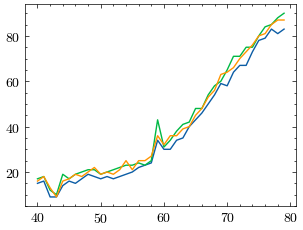

In [15]:

#sat_lla_E=footprint(time_array[0],latitude_E, longitude_E, altitude_E, alt, vsw=[-345,12,-12])

conjunction_obj = asilib.Conjunction(asi, (np.array(Etime), sat_lla_E.T))
sat_azimuth_elevation, sat_azel_pixels = conjunction_obj.map_azel()
area_intensity = conjunction_obj.intensity()
area_mask = conjunction_obj.equal_area(box=(10,10))
# Need to change masked NaNs to 0s so we can plot the rectangular area contours.
area_mask[np.where(np.isnan(area_mask))] = 0
plt.plot(area_intensity) #This gives us a resolution of 3Hz.


In [16]:
conjunction_obj_irbem = asilib.Conjunction(asi, (np.array(Etime), np.array([cs_lat(Etime), cs_lon(Etime),  cs_alt(Etime)]).T))
#conjunction_obj_irbem.lla_footprint(alt=alt)

We need to now compare IRBEM with my own geopack


Now lets look at images and define some lines for ewograms

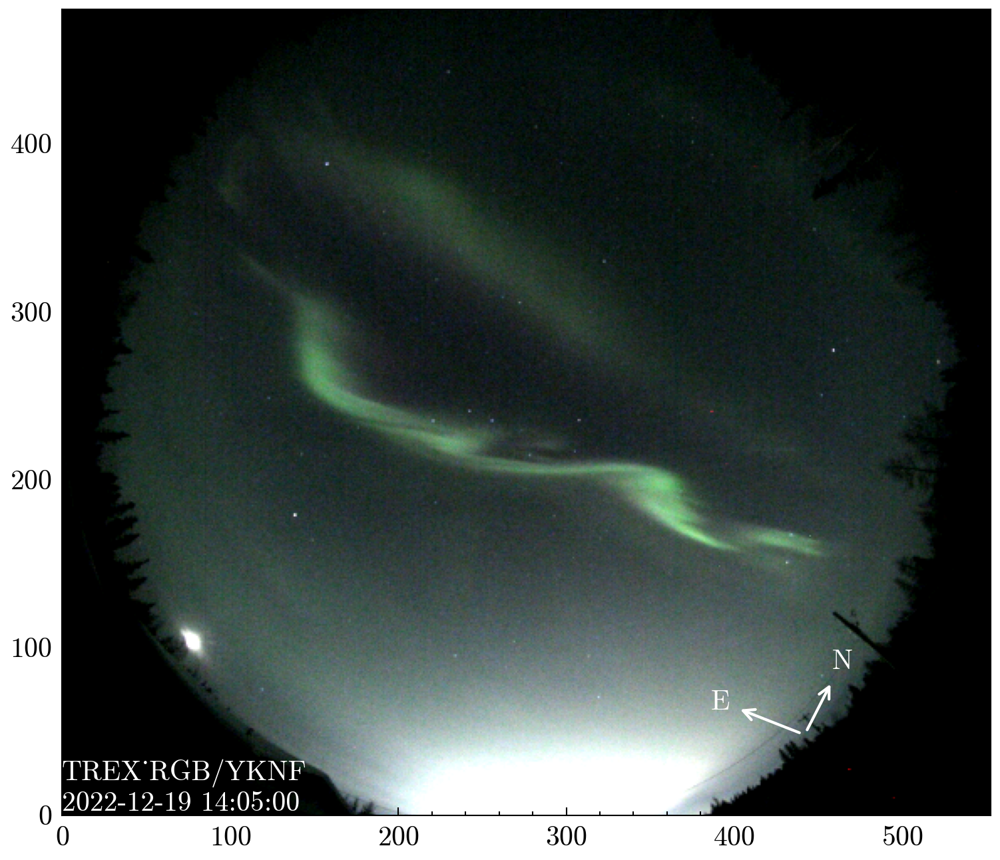

In [17]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
from datetime import datetime
asi_single=asilib.asi.trex_rgb(location_code='yknf', alt=alt,  time=datetime(2022,12,19,14,5), colors='rgb')

ax, im_good = asi_single.plot_fisheye(ax=ax)


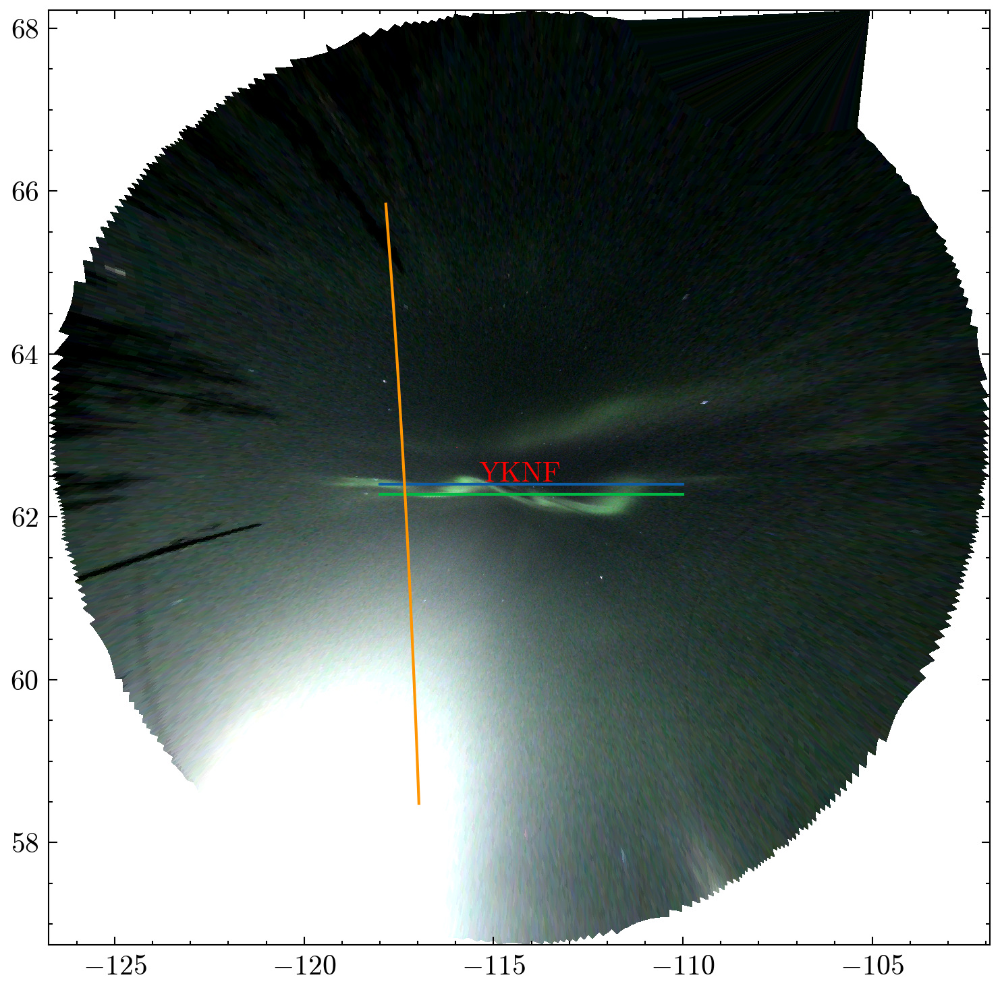

In [18]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
ax, im_good = asi_single.plot_map(ax=ax)
coords=im_good.get_coordinates()
x_coords=coords[:,:,0]
y_coords=coords[:,:,1]
x = np.linspace(-118, -110, 200)
y= np.linspace(62.4, 62.4, 200)
plt.plot(x,y)
y= np.linspace(62.28, 62.28, 200)
plt.plot(x,y)

plt.plot(sat_lla_E[1], sat_lla_E[0])



In [19]:


# grid_lats, grid_lons: 2D arrays representing the latitude and longitude grid
# line_lats, line_lons: 1D arrays representing the latitude and longitude of the line

def find_closest_grid_points(grid_lats, grid_lons, line_lats, line_lons):
    # Reshape line_lats and line_lons for broadcasting with the grid
    line_lats_reshaped = line_lats[:, np.newaxis, np.newaxis]  # Shape: (num_points, 1, 1)
    line_lons_reshaped = line_lons[:, np.newaxis, np.newaxis]  # Shape: (num_points, 1, 1)

    # Compute squared Euclidean distances using broadcasting
    lat_diff = grid_lats[np.newaxis, :, :] - line_lats_reshaped  # Shape: (num_points, grid_lat_dim, grid_lon_dim)
    lon_diff = grid_lons[np.newaxis, :, :] - line_lons_reshaped  # Shape: (num_points, grid_lat_dim, grid_lon_dim)
    distances = lat_diff**2 + lon_diff**2  # Shape: (num_points, grid_lat_dim, grid_lon_dim)

    # Find the flat index of the minimum distance for each point along the grid axes
    min_indices_flat = np.argmin(distances.reshape(distances.shape[0], -1), axis=1)  # Shape: (num_points,)

    # Convert flat indices back to 2D grid indices for all points at once
    grid_shape = grid_lats.shape
    closest_indices = np.stack(np.unravel_index(min_indices_flat, grid_shape), axis=1)

    return closest_indices.T

# Example usage
grid_lats = np.array(y_coords)  # Replace y_coords with the actual grid latitude array (2D)
grid_lons = np.array(x_coords)  # Replace x_coords with the actual grid longitude array (2D)

line_lats = np.array(y)         # Replace y with the actual line latitude array (1D)
line_lons = np.array(x)         # Replace x with the actual line longitude array (1D)

closest_indices = find_closest_grid_points(grid_lats, grid_lons, line_lats, line_lons)


2022-12-19 14:02:00 2022-12-19 14:08:00


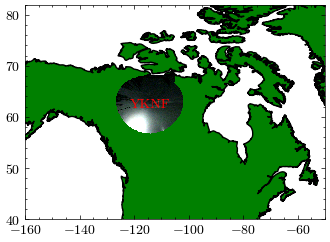

In [20]:
import numpy as np
# Define the coordinates for y values
x_1 = np.linspace(-119, -107, 500)  # x-coordinates (longitude range)
y_values = np.array([62.28, 62.32, 62.36, 62.40])  # y-values for different lines (latitude)
y_target = np.tile(y_values[:, np.newaxis], (1, 500))  # 2D array of shape (4, 800)
print(time_array[0], time_array[-1])
# Initialize ASI object
asi = asilib.asi.trex_rgb(location_code='yknf', alt=alt ,  time_range=(time_array[0], time_array[-1]))

# Lists to hold results
pixel_closest_list = np.zeros((4, 120, 500, 3), dtype=np.uint8)
time_ewo = []

movie_generator = asi.animate_map_gen()
closest_indices = []
for i, (time, image, _, im) in enumerate(movie_generator):
    if i ==0:
        coords = im.get_coordinates()
        grid_lons = coords[:, :, 0]
        grid_lats = coords[:, :, 1]
        # Loop over each y-value target line
        for j in range(len(y_values)):
            # Get closest grid points for all 800 points on the line
            closest_indices.append(np.transpose(find_closest_grid_points(grid_lats, grid_lons, y_target[j], x_1))) 
            
            # Ensure closest_indices has shape (800, 2) where 800 points correspond to x_1
            # closest_indices[0] = indices of closest grid points for latitudes
            # closest_indices[1] = indices of closest grid points for longitudes

            if closest_indices[j].shape[0] == 500:
                # Fetch the RGB values for all 800 closest grid points using advanced indexing
                pixel_values = image[closest_indices[j][:, 0], closest_indices[j][:, 1], :]  # shape (800, 3)
                
                # Append all pixel values for this y-value line
                pixel_closest_list[j][i] = pixel_values
            else:
                print(f"Error: closest_indices does not match the expected shape for y_value index {j}")
    else:
         for j in range(len(y_values)):
            # Get closest grid points for all 800 points on the line
            
            # Ensure closest_indices has shape (800, 2) where 800 points correspond to x_1
            # closest_indices[0] = indices of closest grid points for latitudes
            # closest_indices[1] = indices of closest grid points for longitudes

            if closest_indices[j].shape[0] == 500:
                # Fetch the RGB values for all 800 closest grid points using advanced indexing
                pixel_values = image[closest_indices[j][:, 0], closest_indices[j][:, 1], :]  # shape (800, 3)
                
                # Append all pixel values for this y-value line
                pixel_closest_list[j][i] = pixel_values
            else:
                print(f"Error: closest_indices does not match the expected shape for y_value index {j}")


    time_ewo.append(time)
    if i==119:
        break

# Unpack the pixel closest lists for each y-value
pixel_closest_30, pixel_closest_32, pixel_closest_34, pixel_closest_36 = pixel_closest_list


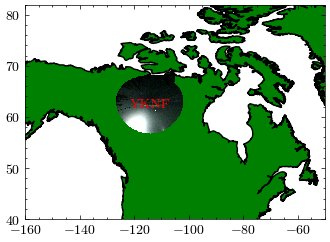

In [21]:


# Initialize ASI object
asi = asilib.asi.trex_rgb(location_code='yknf', alt=alt ,   time_range=(datetime(2022,12,19,14,4), datetime(2022,12,19,14,6)))

indicies_sat=[]
pixel_closest_sat = np.zeros((40, 1920, 3), dtype=np.uint8)
movie_generator = asi.animate_map_gen()
time_sat_keo = []
lats_sat_keo=[]
for i, (time, image, _, im) in enumerate(movie_generator): 
    indicies_sat.append(np.where((Etime >= np.datetime64(time)) & (Etime <= np.datetime64(time + timedelta(seconds=3))))[0])
    if i ==0:
        coords = im.get_coordinates()
        grid_lons = coords[:, :, 0]
        grid_lats = coords[:, :, 1]
        closest_indices_sat = np.transpose(find_closest_grid_points(grid_lats, grid_lons, sat_lla_E[0], sat_lla_E[1]))
        pixel_closest_sat[i] = ( image[closest_indices_sat[:, 0], closest_indices_sat[:, 1], :])
    else:
         pixel_closest_sat[i] = ( image[closest_indices_sat[:, 0], closest_indices_sat[:, 1], :])
    lats_sat_keo.append( sat_lla_E[0])
    time_sat_keo.append(time)
    if i==39:
        break



20221219_140400_140600_trex_rgb_yknf_map.mp4: |####                     | 19%


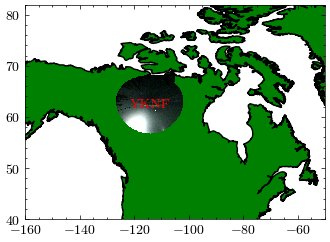

In [22]:


# Initialize ASI object
asi = asilib.asi.trex_rgb(location_code='yknf', alt=alt,   time_range=(datetime(2022,12,19,14,4), datetime(2022,12,19,14,6)))


pixel_closest_sat_track = []
movie_generator = asi.animate_map_gen()
time_sat_alongtrack = []
indicies_sat_track =  []
lats=[]
for i, (time, image, _, im) in enumerate(movie_generator): 
    indicies = np.where((Etime >= np.datetime64(time)) & (Etime <= np.datetime64(time + timedelta(seconds=3))))[0]
    indicies_sat_track.append(indicies)
    coords = im.get_coordinates()
    grid_lons = coords[:, :, 0]
    grid_lats = coords[:, :, 1]
    closest_indices_sat = np.transpose(find_closest_grid_points(grid_lats, grid_lons, sat_lla_E[0][indicies], sat_lla_E[1][indicies]))
    lats.append(sat_lla_E[0][indicies])
    pixel_closest_sat_track.append( image[closest_indices_sat[:, 0], closest_indices_sat[:, 1], :])

    if i==39:
        break



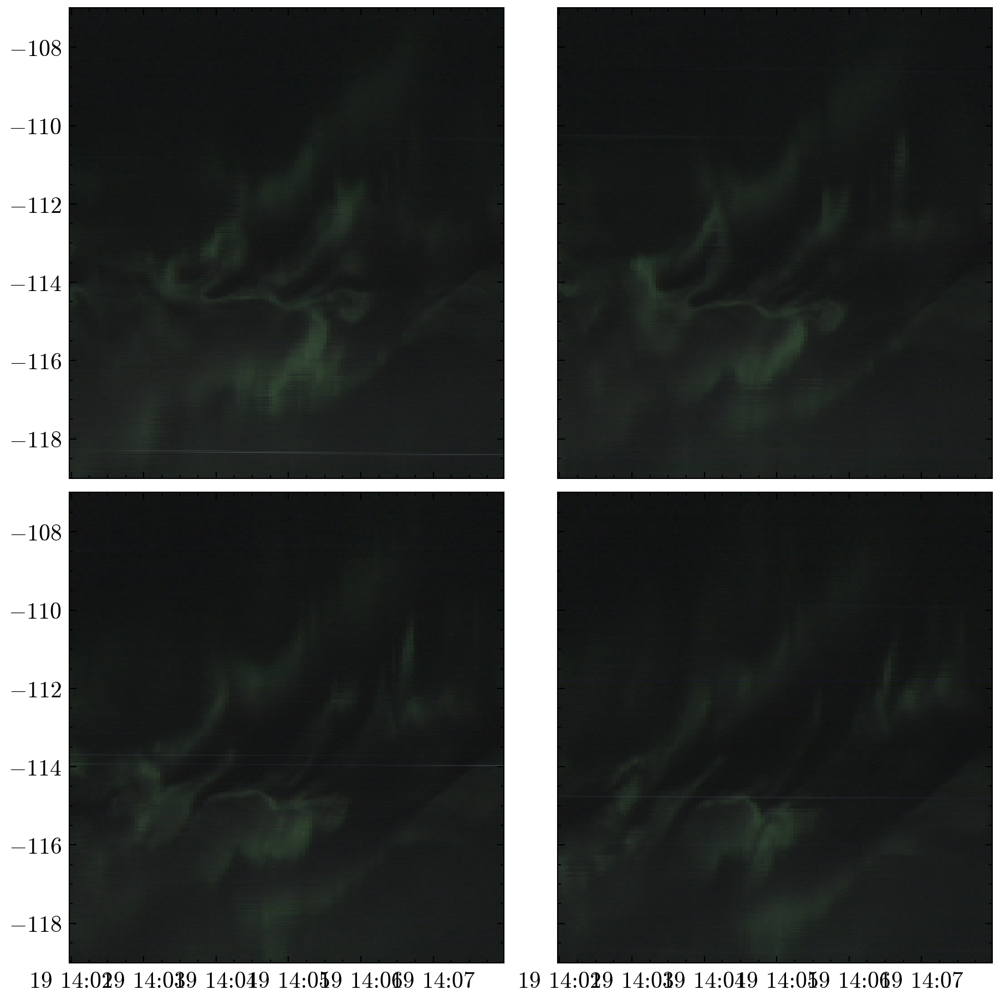

In [23]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300, nrows=2,ncols=2, constrained_layout=True, sharex=True, sharey=True)

ax[0][0].pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_30, 1, 0 ))
ax[0][1].pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_32, 1, 0 ))
ax[1][0].pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_34, 1, 0 ))
ax[1][1].pcolormesh( time_ewo, x_1, np.swapaxes(pixel_closest_36, 1, 0 ))

Distance: 67.49 km
Time: 90.0 s
Velocity: 0.7498958098930414
Distance: 75.18 km
Time: 90.0 s
Velocity: 0.8353089353458863
Distance: 108.73 km
Time: 115.0 s
Velocity: 0.9454867705822165
Distance: 113.76 km
Time: 115.0 s
Velocity: 0.9891868623024784


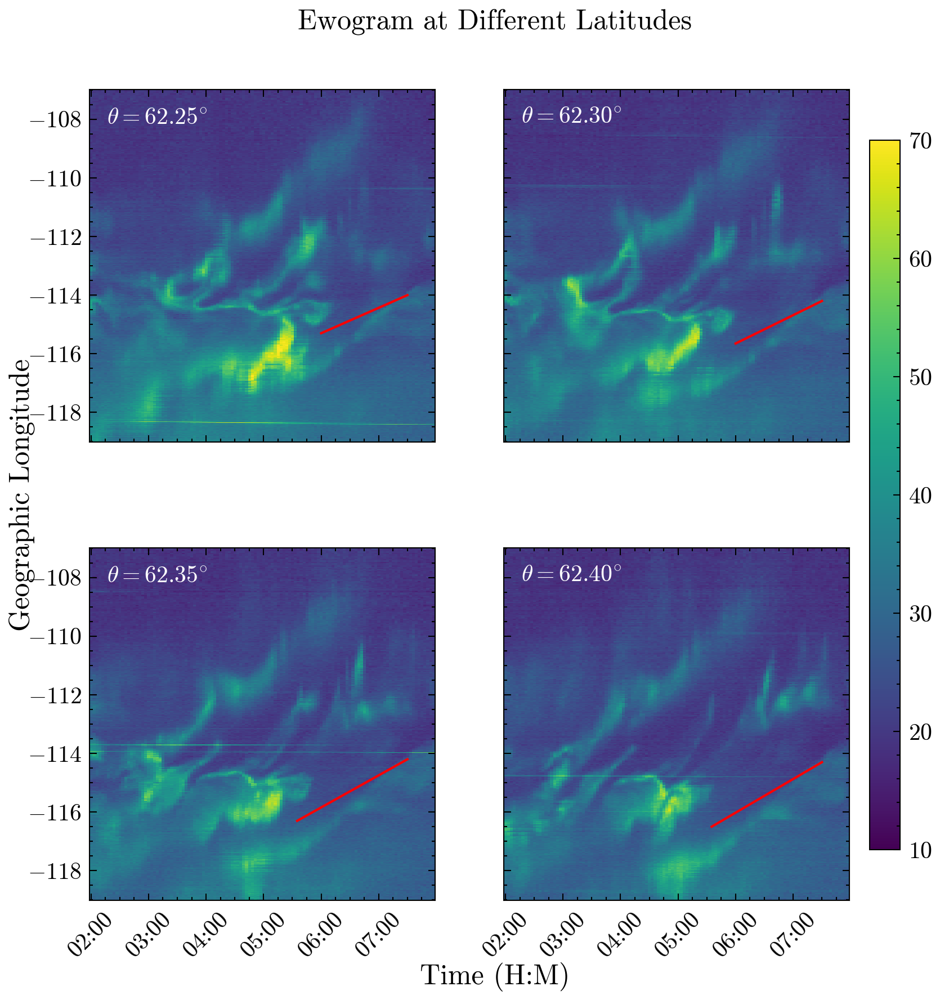

In [24]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd
from geopy.distance import geodesic

fig, ax = plt.subplots(figsize=(6, 6), dpi=300, nrows=2, ncols=2, sharex=True, sharey=True)

# Plotting the pcolormesh for each subplot
ax[0][0].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_30, 1, 0)[:, :, 1], vmin=10, vmax=70)
ax[0][1].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_32, 1, 0)[:, :, 1], vmin=10, vmax=70)
ax[1][0].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_34, 1, 0)[:, :, 1], vmin=10, vmax=70)
im = ax[1][1].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_36, 1, 0)[:, :, 1], vmin=10, vmax=70)

# Adding a color bar
fig.subplots_adjust(left=0.1, right=0.85, top=0.9, bottom=0.1, hspace=0.3, wspace=0.2)  # Adjust spacing
cbar_ax = fig.add_axes([0.87, 0.15, 0.03, 0.7])  # Adjust colorbar position
fig.colorbar(im, cax=cbar_ax)

# Formatting the x-axis with minutes and seconds
locator = mdates.MinuteLocator(interval=1)  # Shows every minute
formatter = mdates.DateFormatter('%M:%S')  # Format to show minutes:seconds

for axes in ax.flat:
    axes.xaxis.set_major_locator(locator)
    axes.xaxis.set_major_formatter(formatter)
    axes.tick_params(axis='x', rotation=45)

# Adding title and labels
fig.suptitle("Ewogram at Different Latitudes")
fig.supxlabel(r"Time (H:M)")
fig.supylabel(r"Geographic Longitude")

# Adding latitude text to the top left of each subplot
latitudes = [62.25, 62.3, 62.35, 62.40]
ax[0][0].text(0.05, 0.95, f"$\\theta={latitudes[0]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[0][0].transAxes, color='white')
ax[0][1].text(0.05, 0.95, f"$\\theta={latitudes[1]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[0][1].transAxes, color='white')
ax[1][0].text(0.05, 0.95, f"$\\theta={latitudes[2]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[1][0].transAxes, color='white')
ax[1][1].text(0.05, 0.95, f"$\\theta={latitudes[3]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[1][1].transAxes, color='white')

#ax1

start_datetime = pd.Timestamp('2022-12-19 14:06')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -115.3
end_longitude = -114.0
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

coord1 = (62.28, -115.3)  
coord2 = (62.28, -114.0)   

# Calculate the distance
distance = geodesic(coord1, coord2).kilometers




# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[0][0].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax2
start_datetime = pd.Timestamp('2022-12-19 14:06')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -115.65
end_longitude = -114.2
coord1 = (62.32, start_longitude)  # Los Angeles, CA
coord2 = (62.32, end_longitude )   # New York, NY

# Calculate the distance
distance = geodesic(coord1, coord2).kilometers
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[0][1].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax3
start_datetime = pd.Timestamp('2022-12-19 14:05:35')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -116.3
end_longitude = -114.2
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

coord1 = (62.36, start_longitude)  # Los Angeles, CA
coord2 = (62.36, end_longitude )   # New York, NY
distance = geodesic(coord1, coord2).kilometers
# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[1][0].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax4
start_datetime = pd.Timestamp('2022-12-19 14:05:35')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -116.5
end_longitude = -114.3
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)
coord1 = (62.4, start_longitude)  # Los Angeles, CA
coord2 = (62.4, end_longitude )   # New York, NY
distance = geodesic(coord1, coord2).kilometers
# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[1][1].plot(date_range, longitude_values, color='red')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")


Distance: 67.49 km
Time: 85.0 s
Velocity: 0.7940073281220439
Distance: 80.36 km
Time: 90.0 s
Velocity: 0.8929137817388475
Distance: 108.73 km
Time: 115.0 s
Velocity: 0.9454867705822165
Distance: 113.76 km
Time: 115.0 s
Velocity: 0.9891868623024784


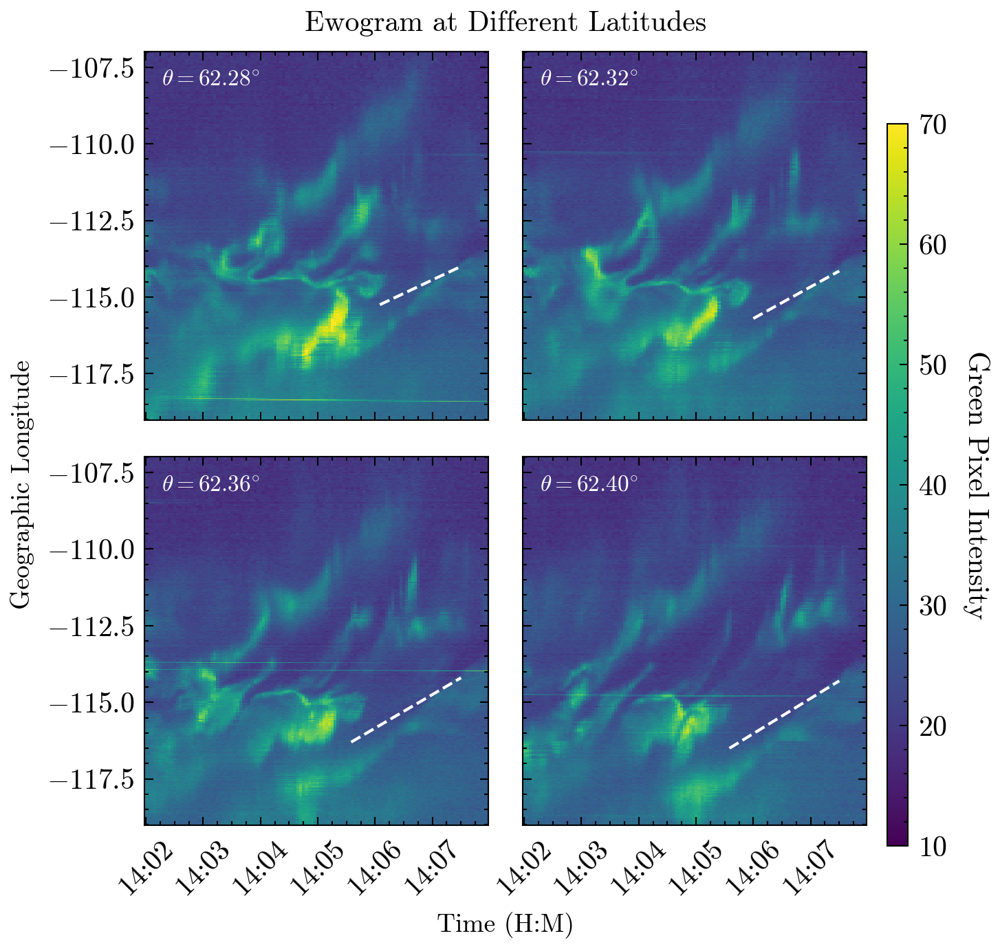

In [25]:
import matplotlib.dates as mdates

# Create the figure and subplots with further reduced white space
fig, ax = plt.subplots(figsize=(5,5), dpi=300, nrows=2, ncols=2, sharex=True, sharey=True)

# Plot the data
ax[0][0].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_30, 1, 0 )[:,:,1], vmin=10, vmax=70)
ax[0][1].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_32, 1, 0 )[:,:,1], vmin=10, vmax=70)
ax[1][0].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_34, 1, 0 )[:,:,1], vmin=10, vmax=70)
im = ax[1][1].pcolormesh(time_ewo, x_1, np.swapaxes(pixel_closest_36, 1, 0 )[:,:,1], vmin=10, vmax=70)

# Adjust subplot parameters to minimize white space even more
fig.subplots_adjust(left=0.15, right=0.85, top=0.92, bottom=0.17, hspace=0.1, wspace=0.1)

# Adjust colorbar positioning (narrower and closer to subplots)
cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('Green Pixel Intensity', rotation=-90, labelpad=15 ) 
# Set x-axis formatters
locator = mdates.MinuteLocator(interval=1)  # Shows every minute
formatter = mdates.DateFormatter('%H:%M')

for axes in ax.flat:
    axes.xaxis.set_major_locator(locator)
    axes.xaxis.set_major_formatter(formatter)
    axes.tick_params(axis='x', rotation=45)

# Set titles and labels
fig.suptitle("Ewogram at Different Latitudes", fontsize=10, y=0.96)  # Title closer to subplots
fig.supxlabel(r"Time (H:M)", fontsize=9, y=0.06)  # X label closer to bottom
fig.supylabel(r"Geographic Longitude", fontsize=9)  # Y label closer to left

# Add text labels to each subplot with minimal spacing
latitudes = [62.28, 62.32, 62.36, 62.40]
ax[0][0].text(0.05, 0.95, f"$\\theta={latitudes[0]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[0][0].transAxes, color='white', fontsize=8)
ax[0][1].text(0.05, 0.95, f"$\\theta={latitudes[1]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[0][1].transAxes, color='white', fontsize=8)
ax[1][0].text(0.05, 0.95, f"$\\theta={latitudes[2]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[1][0].transAxes, color='white', fontsize=8)
ax[1][1].text(0.05, 0.95, f"$\\theta={latitudes[3]:.2f}^{{\\circ}}$", ha='left', va='top', transform=ax[1][1].transAxes, color='white', fontsize=8)

#ax1

start_datetime = pd.Timestamp('2022-12-19 14:06:05')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -115.25
end_longitude = -114.0
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

coord1 = (62.28, -115.3)  
coord2 = (62.28, -114.0)   

# Calculate the distance
distance = geodesic(coord1, coord2).kilometers




# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[0][0].plot(date_range, longitude_values, color='white', linestyle='dashed')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax2
start_datetime = pd.Timestamp('2022-12-19 14:06')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -115.7
end_longitude = -114.15
coord1 = (62.32, start_longitude)  # Los Angeles, CA
coord2 = (62.32, end_longitude )   # New York, NY

# Calculate the distance
distance = geodesic(coord1, coord2).kilometers
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[0][1].plot(date_range, longitude_values, color='white', linestyle='dashed')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax3
start_datetime = pd.Timestamp('2022-12-19 14:05:35')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -116.3
end_longitude = -114.2
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)

coord1 = (62.36, start_longitude)  # Los Angeles, CA
coord2 = (62.36, end_longitude )   # New York, NY
distance = geodesic(coord1, coord2).kilometers
# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[1][0].plot(date_range, longitude_values, color='white', linestyle='dashed')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")
#ax4
start_datetime = pd.Timestamp('2022-12-19 14:05:35')
end_datetime = pd.Timestamp('2022-12-19 14:07:30')
start_longitude = -116.5
end_longitude = -114.3
date_range = pd.date_range(start=start_datetime, end=end_datetime, periods=100)
coord1 = (62.4, start_longitude)  # Los Angeles, CA
coord2 = (62.4, end_longitude )   # New York, NY
distance = geodesic(coord1, coord2).kilometers
# Generate longitude values
longitude_values = np.linspace(start_longitude, end_longitude, num=100)
ax[1][1].plot(date_range, longitude_values, color='white', linestyle='dashed')
print(f"Distance: {distance:.2f} km")
print(f"Time: {(end_datetime - start_datetime).total_seconds()} s")
print(f"Velocity: {distance / (end_datetime - start_datetime).total_seconds() }")


TREX_RGB YKNF keogram: |################################################| 100%


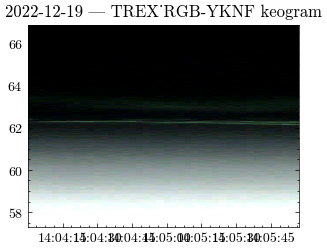

In [26]:
_, im_keogram = asi.plot_keogram()

(40, 1920)


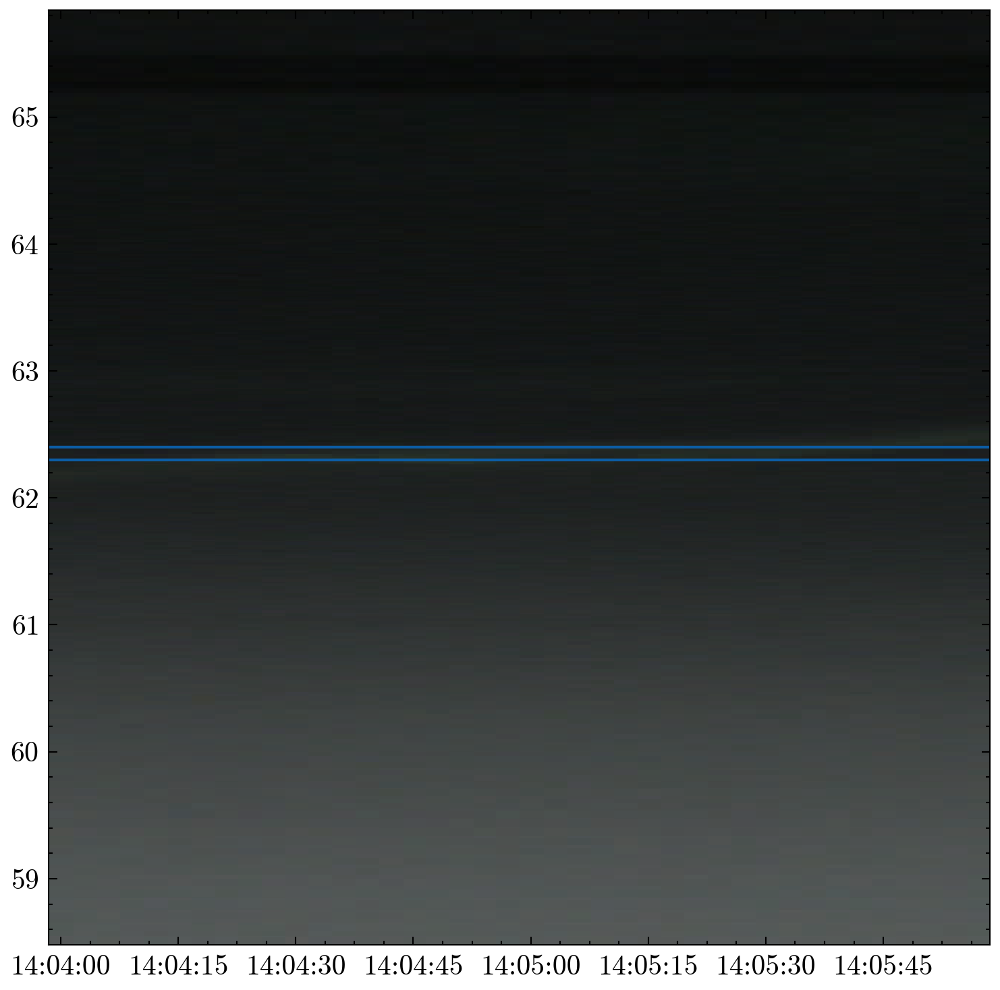

In [27]:
fig, ax = plt.subplots(figsize=(6,6), dpi=300)
print(np.shape(lats_sat_keo))
plt.pcolormesh( time_sat_keo, sat_lla_E[0], np.swapaxes(pixel_closest_sat, 1, 0 ))
plt.axhline(62.3)
plt.axhline(62.4)

(120,)
[[18 17 15 ... 16 17 17]
 [18 17 15 ... 16 17 17]
 [18 17 15 ... 16 17 17]
 ...
 [88 90 89 ... 90 89 91]
 [89 90 90 ... 92 89 89]
 [89 90 90 ... 92 89 89]]


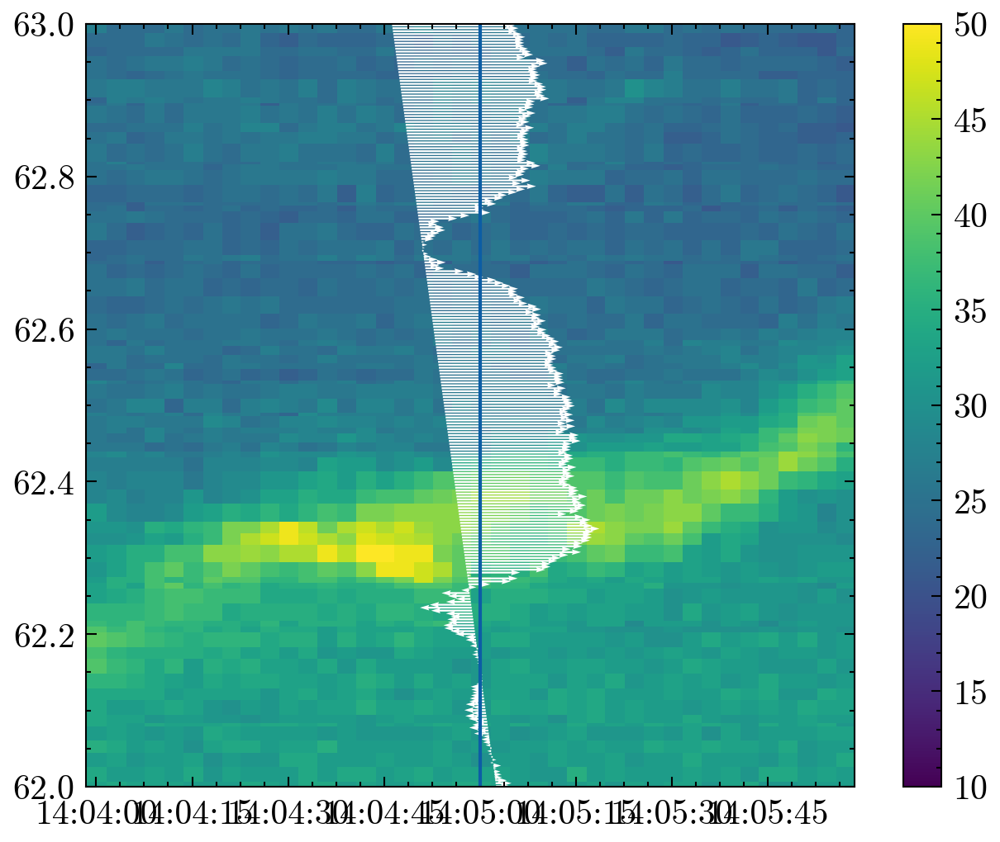

In [28]:
print(np.shape(time_ewo))
fig, ax = plt.subplots(figsize=(5,4), dpi=300)
im = plt.pcolormesh( time_sat_keo, sat_lla_E[0], np.swapaxes(pixel_closest_sat, 1, 0 )[:,:,1], vmin=10, vmax=50)
print(np.swapaxes(pixel_closest_sat, 1, 0 )[:,:,1])
plt.ylim(62,63)

import matplotlib.pyplot as plt
from scipy.interpolate import CubicSpline
cs = CubicSpline(Btime, sat_lla_B[0])
latitudes_16sps = cs(Etime)
cs = CubicSpline(Btime, BNEC[:,0])
Bs_16sps = cs(Etime)
u_zeros = np.zeros_like(VNEC[:, 1])
U_perpendicular = -VNEC[:, 1] / np.max(np.abs(VNEC[:, 1]))  # Inverting y-component for perpendicular direction
V_perpendicular = VNEC[:, 1] / np.max(np.abs(VNEC[:, 1]))   # Keeping the x-component

plt.quiver( Etime,sat_lla_E[0], V_perpendicular, u_zeros, color='white', scale=1, scale_units='inches')

plt.colorbar(im)
from datetime import datetime

locator = mdates.SecondLocator(interval=15)  # Shows every minute

ax.axvline(datetime(2022,12,19,14,5))

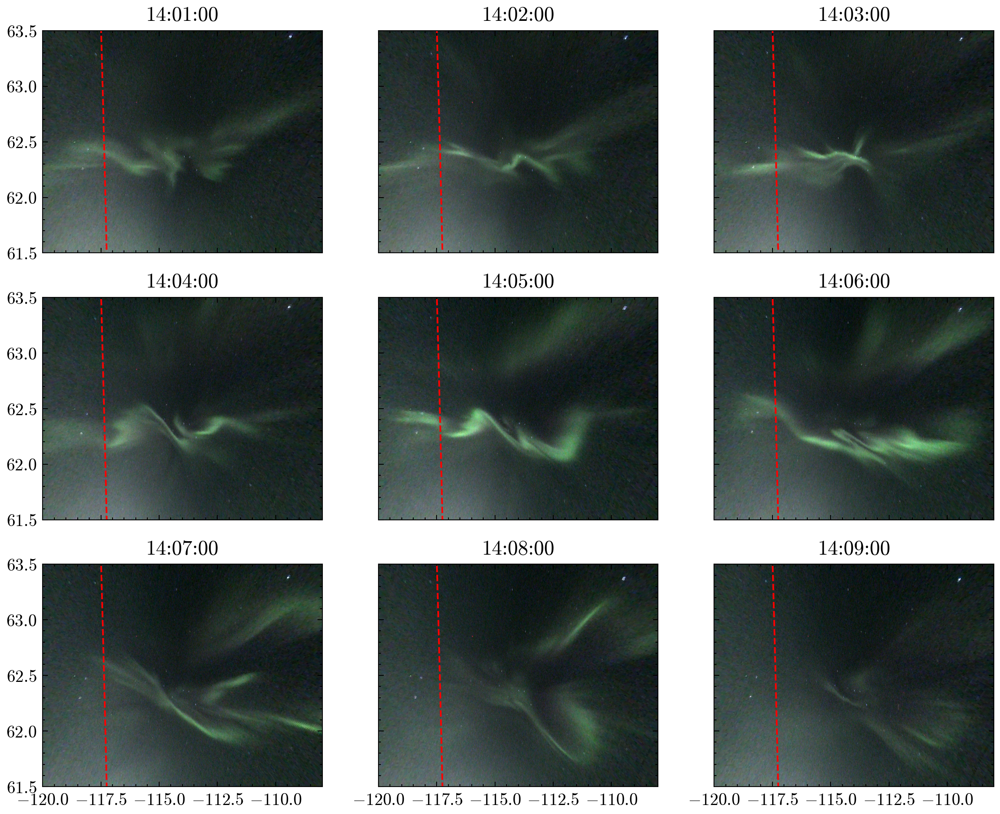

In [29]:
fig, axes = plt.subplots(figsize=(10,8), nrows=3, ncols=3, dpi=300, sharex=True, sharey=True)
axlist=axes.flatten()
time_array_pannel=[time_array[0]-timedelta(seconds=60)+timedelta(seconds=60*i) for i in range(9)]

for i in range(len(time_array_pannel)):
    asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt, time=time_array_pannel[i], colors='rgb')

    asi.plot_map(ax=axlist[i], asi_label=False)
    axlist[i].set_title(time_array_pannel[i].strftime('%H:%M:%S%f')[:-6])
    axlist[i].set_ylim(61.5, 63.5)
    axlist[i].set_xlim(-120,-108)
    axlist[i].plot(sat_lla_E[1], sat_lla_E[0], color='red', linestyle='dashed')
plt.savefig("test.png",bbox_inches='tight')


In [ ]:
fig, axes = plt.subplots(figsize=(10,8), nrows=3, ncols=3, dpi=300, sharex=True, sharey=True)
axlist=axes.flatten()
time_array_pannel=[time_array[0]-timedelta(seconds=60)+timedelta(seconds=60*i) for i in range(9)]

for i in range(len(time_array_pannel)):
    asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt, time=time_array_pannel[i], colors='rgb')

    asi.plot_map(ax=axlist[i], asi_label=False)
    axlist[i].set_title(time_array_pannel[i].strftime('%H:%M:%S%f')[:-6])
    axlist[i].set_ylim(62, 63)
    axlist[i].set_xlim(-120,-108)
    axlist[i].plot(sat_lla_E[1], sat_lla_E[0], color='red', linestyle='dashed')
    axlist[i].quiver( sat_lla_E[1],sat_lla_E[0], V_perpendicular*0.75, u_zeros, color='white', scale=1, scale_units='inches', alpha=0.25)
plt.savefig("test.png",bbox_inches='tight')


In [ ]:
fig, axes = plt.subplots(figsize=(10,8), nrows=3, ncols=3, dpi=300, sharex=True, sharey=True)
axlist=axes.flatten()
time_array_pannel=[time_array[0]+timedelta(seconds=120)+timedelta(seconds=20*i) for i in range(9)]

for i in range(len(time_array_pannel)):
    asi=asilib.asi.trex_rgb(location_code='yknf', alt=alt, time=time_array_pannel[i], colors='rgb')

    asi.plot_map(ax=axlist[i], asi_label=False)
    axlist[i].set_title(time_array_pannel[i].strftime('%H:%M:%S%f')[:-6])
    axlist[i].set_ylim(62, 63)
    axlist[i].set_xlim(-120,-108)
    axlist[i].plot(sat_lla_E[1], sat_lla_E[0], color='red', linestyle='dashed')
    axlist[i].quiver( sat_lla_E[1],sat_lla_E[0], V_perpendicular*0.75, u_zeros, color='white', scale=1, scale_units='inches', alpha=0.25)
plt.savefig("test.png",bbox_inches='tight')


In [ ]:

fig, ax = plt.subplots(figsize=(5,3), dpi=300)
im = plt.pcolormesh( time_sat_keo, sat_lla_E[0], np.swapaxes(pixel_closest_sat, 1, 0 ))
plt.ylim(62,63)


from scipy.interpolate import CubicSpline
cs = CubicSpline(Btime, sat_lla_B[0])
latitudes_16sps = cs(Etime)
cs = CubicSpline(Btime, BNEC[:,0])
Bs_16sps = cs(Etime)
U_perpendicular = -VNEC[:, 1] / np.max(np.abs(VNEC[:, 1]))  # Inverting y-component for perpendicular direction
V_perpendicular = VNEC[:, 1] / np.max(np.abs(VNEC[:, 1]))   # Keeping the x-component

plt.quiver( Etime,sat_lla_E[0], V_perpendicular, u_zeros, color='white', scale=1, scale_units='inches')


locator = mdates.SecondLocator(interval=15)  # Shows every minute
formatter = mdates.DateFormatter('%M:%S')


ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)
ax.tick_params(axis='x', rotation=45)

In [ ]:
plt.plot( Bs_16sps)

Now lets make an ewogram

In [ ]:
lat16 = sat_lla_E[0]
lat50 = sat_lla_B[0]

In [ ]:
def flatten_comprehension(matrix):
    return [item for row in matrix for item in row]

In [ ]:

alongtrackpixel=[]
lats_used=[]

alongtrackpixel = np.array(flatten_comprehension(pixel_closest_sat_track), dtype=np.uint8)
lats_used = np.array(flatten_comprehension(lats))


In [ ]:
fig, axes = plt.subplots(figsize=(3, 3), dpi=300, constrained_layout=True, sharex=True)
plt.plot(lats_used, alongtrackpixel[:, 1], label="Satellite Track Intensity")
print(len(lats_used))

In [ ]:
plt.pcolormesh(im_good.get_coordinates()[:, :, 0], im_good.get_coordinates()[:, :, 1],im_good.get_array())
plt.ylim(62,64)
plt.xlim(-120, -110)
plt.plot(sat_lla_E[1], sat_lla_E[0])
plt.plot(im_good.get_coordinates()[:, 300, 0], im_good.get_coordinates()[:, 300, 1])

In [ ]:
from datetime import datetime
plt.pcolormesh(im_keogram.get_coordinates()[:, :, 0], im_keogram.get_coordinates()[:, :, 1],im_keogram.get_array())
#plt.ylim(62,64)    
print(len(im_keogram.get_coordinates()[0, :, 0]))
print(im_keogram.get_coordinates()[:, :, 0])
datetimes = [datetime(1970, 1, 1) + timedelta(days=days) for days in im_keogram.get_coordinates()[0, :, 0]]
#plt.xlim(-120, -110)
print(datetimes[61])
#plt.plot(sat_lla_E[1], sat_lla_E[0])
plt.plot(im_keogram.get_coordinates()[:, 61, 0], im_keogram.get_coordinates()[:, 61, 1])

In [ ]:
plt.plot(im_keogram.get_coordinates()[:, 61, 1][:-1], im_keogram.get_array()[:, 61, 0]*110+10, label="Meridian Slice at 14:05:00") #change colors

In [ ]:

unique_latitudes, indices = np.unique(lats_used, return_index=True)
avg_pixel_intensity = np.array([np.mean(alongtrackpixel[:, 1][lats_used == lat]) for lat in unique_latitudes])
# Create a cubic spline interpolator
spline = CubicSpline(unique_latitudes, avg_pixel_intensity)

# Create a finer grid of latitude values for smoother plotting
latitudes_dense_sat = np.linspace(unique_latitudes.min(), unique_latitudes.max(), 400)
smoothed_intensity_sat = spline(latitudes_dense_sat)

In [ ]:
lats_keo=im_keogram.get_coordinates()[:, 61, 1][:-1]
pixel_keo = im_keogram.get_array()[:, 61, 0]*110+22
unique_latitudes, indices = np.unique(lats_keo, return_index=True)
avg_pixel_intensity = np.array([np.mean(pixel_keo[lats_keo == lat]) for lat in unique_latitudes])
# Create a cubic spline interpolator
spline = CubicSpline(unique_latitudes, avg_pixel_intensity)

# Create a finer grid of latitude values for smoother plotting
latitudes_dense_keo = np.linspace(unique_latitudes.min(), unique_latitudes.max(), 400)
smoothed_intensity_keo = spline(latitudes_dense_keo)

In [ ]:
plt.plot(latitudes_dense_sat, smoothed_intensity_sat)
plt.plot(latitudes_dense_keo, smoothed_intensity_keo)

We want our plots to have lat verus data


In [ ]:

fig, axes = plt.subplots(figsize=(6,6), nrows=3, dpi=300, constrained_layout=True, sharex=True)
#We want B east and north, then E north and East and then the pixel intensity of the satellite and the pixel intensity of the keogram
axes[0].plot(lat16, VNEC[:, 1], label=r"$V_{E}$")





Btwin=axes[1].twinx()
Btwin.plot(lat50,BNEC[:,0], label=r"$B_{N}$", color='green')
axes[1].plot(lat50,BNEC[:,0], label=r"$B_{N}$", color='green')
axes[1].plot(lat50, BNEC[:, 1], label=r"$B_{E}$")
print(np.shape(area_intensity))
print(np.shape(lats_used))

axes[2].plot(latitudes_dense_sat, smoothed_intensity_sat, label="Satellite Track ")

axes[2].plot(latitudes_dense_keo, smoothed_intensity_keo, label="Keogram at 14:05:00") #change colors, 110+10 is scaling in asilib



plt.suptitle("In-situ Measurements of Swarm and TREx-RGB", y=1)
fig.supxlabel("Latitude")

axes[0].legend(loc=3)
axes[1].legend(loc=3)
axes[2].legend(loc=3)

plt.tight_layout(pad=0.3, w_pad=0.6, h_pad=1.2)

axes[0].set_ylabel(r"Ion Velocities East (m/s)")
axes[1].set_ylabel(r"Magnetic Field (nT)")
axes[2].set_ylabel(r"Green Channel Pixel Intensity", labelpad=20)

axes[0].set_xlim(62.2, 62.5)
axes[1].set_xlim(62.2, 62.5)
axes[2].set_xlim(62.2, 62.5)

axes[2].set_ylim(20,50)
axes[1].set_ylim(-450,-300)
axes[0].set_ylim(-500, 1500)
Btwin.set_ylim(40,100)

